In [2]:
import xarray as xr

ds1 = xr.open_dataset("LIS/LIS_HIST_202501_OL_swe.nc")
ds2 = xr.open_dataset("LIS/LIS_HIST_202501_NR_swe.nc")
ds3 = xr.open_dataset("LIS/LIS_HIST_202501_DA_heuristic_swe.nc")
ds4 = xr.open_dataset("LIS/LIS_HIST_202501_DA_DROT_swe.nc")

# display(ds1)
# display(ds2)
# display(ds3)
# display(ds4)

# time = ds1["time"].values
# print(time)

In [3]:
import xarray as xr

ds_nr_500 = xr.open_dataset("LIS/LIS_HIST_202501_NR_swe.nc")

# Coarsen over full domain, using block averaging
ds_nr_1k_full = ds_nr_500.coarsen(
    north_south=2, east_west=2, boundary="trim"
).mean()

# Restore proper grid spacing and domain extent
ds_nr_1k_full = ds_nr_1k_full.assign_attrs(DX=1.0, DY=1.0)

ds_nr_1k_full.to_netcdf("LIS/NR_swe_1km.nc")


In [ ]:
import xarray as xr
import numpy as np
from scipy.io import loadmat
from pathlib import Path




mat = loadmat("LIS/latlon_OLDA_1000m.mat")
lat_mat = mat["lat_missouri_1000m_OL"]
lon_mat = mat["lon_missouri_1000m_OL"]

print("Loaded .mat arrays:", lat_mat.shape, lon_mat.shape)


#attach lat/lon

def attach_latlon(ds, lat, lon):
    """Attach 2D lat/lon arrays from .mat file to LIS dataset."""
    ns, ew = ds.dims["north_south"], ds.dims["east_west"]

    # Match the orientation of .mat arrays to dataset
    arr_lat = lat
    arr_lon = lon
    if arr_lat.shape != (ns, ew):
      
        if arr_lat.T.shape == (ns, ew):
            arr_lat = arr_lat.T
            arr_lon = arr_lon.T
        else:
            raise ValueError(f"Lat/Lon shape {arr_lat.shape} does not match dataset {ns, ew}")

    # Assign coordinates
    ds = ds.assign_coords(
        lat=(("north_south", "east_west"), arr_lat.astype(np.float32)),
        lon=(("north_south", "east_west"), arr_lon.astype(np.float32))
    )

    # Add coordinate metadata
    ds.lat.attrs.update({
        "units": "degrees_north",
        "description": "Latitude from LIS .mat reference"
    })
    ds.lon.attrs.update({
        "units": "degrees_east",
        "description": "Longitude from LIS .mat reference"
    })

    return ds




files = {
    "OL":   "LIS/LIS_HIST_202501_OL_swe.nc",
    "NR":   "LIS/NR_swe_1km.nc",
    "DAH":  "LIS/LIS_HIST_202501_DA_heuristic_swe.nc",
    "DROT": "LIS/LIS_HIST_202501_DA_DROT_swe.nc"
}

for key, path in files.items():
    print(f"\nProcessing {path} ...")
    ds = xr.open_dataset(path)
    ds_out = attach_latlon(ds, lat_mat, lon_mat)

    # Save to new NetCDF file
    out_path = Path(path).with_name(Path(path).stem + "_latlon.nc")
    comp = dict(zlib=True, complevel=4, dtype="float32", shuffle=True)
    enc = {v: comp for v in ds_out.data_vars}
    enc["lat"], enc["lon"] = comp, comp

    ds_out.to_netcdf(out_path, format="NETCDF4", encoding=enc)
    print(f"Saved {out_path}")

print("All datasets now include lat/lon coordinates from .mat file.")


Loaded .mat arrays: (2100, 1750) (2100, 1750)

Processing LIS/LIS_HIST_202501_OL_swe.nc ...


/var/folders/3j/bf68p4fn3dx_92pwhwzqtv5wf5drs2/T/ipykernel_46877/652389085.py:20: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ns, ew = ds.dims["north_south"], ds.dims["east_west"]


Saved LIS/LIS_HIST_202501_OL_swe_latlon.nc

Processing LIS/NR_swe_1km.nc ...


/var/folders/3j/bf68p4fn3dx_92pwhwzqtv5wf5drs2/T/ipykernel_46877/652389085.py:20: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ns, ew = ds.dims["north_south"], ds.dims["east_west"]


Saved LIS/NR_swe_1km_latlon.nc

Processing LIS/LIS_HIST_202501_DA_heuristic_swe.nc ...


/var/folders/3j/bf68p4fn3dx_92pwhwzqtv5wf5drs2/T/ipykernel_46877/652389085.py:20: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ns, ew = ds.dims["north_south"], ds.dims["east_west"]


Saved LIS/LIS_HIST_202501_DA_heuristic_swe_latlon.nc

Processing LIS/LIS_HIST_202501_DA_DROT_swe.nc ...


/var/folders/3j/bf68p4fn3dx_92pwhwzqtv5wf5drs2/T/ipykernel_46877/652389085.py:20: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ns, ew = ds.dims["north_south"], ds.dims["east_west"]


Saved LIS/LIS_HIST_202501_DA_DROT_swe_latlon.nc
All datasets now include lat/lon coordinates from .mat file.


In [ ]:
import xarray as xr
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.cm import get_cmap
from shapely.prepared import prep
import shapely.geometry as sg
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker


plt.style.use("seaborn-v0_8-whitegrid")

var = "SWE_tavg"
fn_nr   = "NR_swe_1km_latlon_area.nc"
fn_ol   = "LIS/LIS_HIST_202501_OL_swe_latlon_area.nc"
fn_dah  = "LIS/LIS_HIST_202501_DA_heuristic_swe_latlon_area.nc"
fn_drot = "LIS/LIS_HIST_202501_DA_DROT_swe_latlon_area.nc"

# Load Missouri River Basin shapefile (EPSG:4326)
mo_basin = gpd.read_file("WBD_10_HU2_Shape/Shape/WBDHU2.shp").to_crs("EPSG:4326")


def make_basin_mask(ds, basin_gdf):
    """Return mask (1=inside basin, 0=outside) matching dataset grid orientation."""
    geom = prep(basin_gdf.unary_union)
    lon2d = ds.lon.values
    lat2d = ds.lat.values
    pts = (sg.Point(xy) for xy in zip(lon2d.ravel(), lat2d.ravel()))
    inside = np.fromiter((geom.contains(p) for p in pts), dtype=bool, count=lon2d.size)
    mask = inside.reshape(lat2d.shape).astype(float)
    return xr.DataArray(mask, coords={"north_south": ds.north_south, "east_west": ds.east_west},
                        dims=("north_south","east_west"))

def compute_actual_area(lat, lon):
    """Compute grid-cell area (km²) using spherical approximation."""
    R = 6371000.0  # Earth radius (m)
    lat_rad = np.deg2rad(lat)
    lon_rad = np.deg2rad(lon)
    dlat = np.abs(np.gradient(lat_rad, axis=0))
    dlon = np.abs(np.gradient(lon_rad, axis=1))
    area_m2 = (R**2) * dlat * dlon * np.cos(lat_rad)
    return (area_m2 / 1e6).astype(np.float32)

def basin_mean_weighted(da, area, mask):
    """Compute area-weighted basin mean."""
    w = area * mask
    return (da * w).sum(dim=("north_south","east_west"), skipna=True) / w.sum(dim=("north_south","east_west"), skipna=True)

def daily_mae(model, ref):
    """Compute daily mean absolute error."""
    a, b = xr.align(model, ref, join="inner")
    return np.abs(a - b)


print("Loading datasets...")
ds_nr   = xr.open_dataset(fn_nr)
ds_ol   = xr.open_dataset(fn_ol)
ds_dah  = xr.open_dataset(fn_dah)
ds_drot = xr.open_dataset(fn_drot)
print("Datasets loaded.")


da_name = var

# base dataset 
ds_ref = ds_nr  

area_km2 = compute_actual_area(ds_ref.lat.values, ds_ref.lon.values)   # shape (n_y, n_x)
area = xr.DataArray(area_km2,
                    coords={"north_south": ds_ref.north_south, "east_west": ds_ref.east_west},
                    dims=("north_south","east_west"))

mask_da = make_basin_mask(ds_ref, mo_basin)  # dims (north_south,east_west), values 0/1


da_nr   = ds_nr[da_name]
da_ol   = ds_ol[da_name]
da_dah  = ds_dah[da_name]
da_drot = ds_drot[da_name]

da_nr, da_ol, da_dah, da_drot = xr.align(da_nr, da_ol, da_dah, da_drot, join="inner")

mean_nr   = basin_mean_weighted(da_nr, area, mask_da)
mean_ol   = basin_mean_weighted(da_ol, area, mask_da)
mean_dah  = basin_mean_weighted(da_dah, area, mask_da)
mean_drot = basin_mean_weighted(da_drot, area, mask_da)

mae_ol_field   = daily_mae(da_ol, da_nr)   # abs(OL - NR)
mae_dah_field  = daily_mae(da_dah, da_nr)  # abs(Heuristic - NR)
mae_drot_field = daily_mae(da_drot, da_nr) # abs(DROT - NR)

mae_ol_field, mae_dah_field, mae_drot_field = xr.align(mae_ol_field, mae_dah_field, mae_drot_field, join="inner")

mae_ts_ol   = basin_mean_weighted(mae_ol_field, area, mask_da)
mae_ts_dah  = basin_mean_weighted(mae_dah_field, area, mask_da)
mae_ts_drot = basin_mean_weighted(mae_drot_field, area, mask_da)

Loading datasets...
Datasets loaded.


/var/folders/3j/bf68p4fn3dx_92pwhwzqtv5wf5drs2/T/ipykernel_71749/3146716572.py:28: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom = prep(basin_gdf.unary_union)


In [ ]:
import os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

os.makedirs("Images", exist_ok=True)


col_width_in = 3.5
col_height_in = 2.2

mpl.rcParams.update({
    "font.size": 8,
    "axes.titlesize": 8,
    "axes.labelsize": 8,
    "xtick.labelsize": 7,
    "ytick.labelsize": 7,
    "legend.fontsize": 6,       
    "figure.dpi": 600,
    "savefig.dpi": 600,
    "figure.titlesize": 8,
    "lines.linewidth": 1.5,
})


col_nr   = "black"        # Nature Run
col_ol   = "green"        # Open Loop
col_dah  = "tab:orange"   # Heuristic
col_drot = "tab:blue"     # DROT


day_locator   = mdates.DayLocator(interval=4)
day_formatter = mdates.DateFormatter("%d-%b")


# SWE Mean 

fig, ax = plt.subplots(figsize=(col_width_in, col_height_in))
ax.plot(mean_ol.time,   mean_ol,  color=col_ol,  lw=1.8, label="Open Loop (OL)")
ax.plot(mean_nr.time,   mean_nr,  color=col_nr,  lw=1.8, label="Nature Run (NR)")
ax.plot(mean_dah.time,  mean_dah, color=col_dah, lw=1.2, label="DA Heuristic")
ax.plot(mean_drot.time, mean_drot, color=col_drot, lw=1.8, label="DA DROT")

ax.set_xlim(np.datetime64("2025-01-01"), np.datetime64("2025-02-01"))
ax.xaxis.set_major_locator(day_locator)
ax.xaxis.set_major_formatter(day_formatter)
plt.setp(ax.get_xticklabels(), rotation=30, ha="right")

ax.set_xlabel("Date (Jan-Feb 2025)", fontsize=8)
ax.set_ylabel("SWE (mm)", fontsize=8)
ax.set_title("Daily Spatially Averaged SWE", fontsize=8)


ax.legend(loc="lower right",
          fontsize=6,
          frameon=False,
          handlelength=1.6,
          columnspacing=0.8,
          labelspacing=0.3,
          bbox_to_anchor=(1.0, 0.02))  

fig.subplots_adjust(top=0.92, bottom=0.18, left=0.15, right=0.97)

swe_mean_out = "Images/swe_mean_col"
fig.savefig(f"{swe_mean_out}.png", dpi=500, bbox_inches='tight', facecolor=fig.get_facecolor())
fig.savefig(f"{swe_mean_out}.pdf", bbox_inches="tight")
print("Saved:", swe_mean_out)
plt.show()
plt.close(fig)


# MAE Time series 
fig, ax = plt.subplots(figsize=(col_width_in, col_height_in))
ax.plot(mae_ts_ol.time,   mae_ts_ol, color=col_ol,  lw=1.8, label="OL - NR")
ax.plot(mae_ts_dah.time,  mae_ts_dah,  color=col_dah, lw=1.8, label="Heuristic - NR")
ax.plot(mae_ts_drot.time, mae_ts_drot, color=col_drot, lw=1.8, label="DROT - NR")

ax.set_xlim(np.datetime64("2025-01-01"), np.datetime64("2025-02-01"))
ax.xaxis.set_major_locator(day_locator)
ax.xaxis.set_major_formatter(day_formatter)
plt.setp(ax.get_xticklabels(), rotation=30, ha="right")

ax.set_xlabel("Date (Jan–Feb 2025)", fontsize=8)
ax.set_ylabel("Spatially Averaged MAE (mm)", fontsize=8)
ax.set_title("Daily Spatially Averaged MAE vs NR", fontsize=8)

ax.legend(loc="lower right",
          fontsize=6,
          frameon=False,
          handlelength=1.6,
          columnspacing=0.8,
          labelspacing=0.3,
          bbox_to_anchor=(1.0, 0.02))

fig.subplots_adjust(top=0.92, bottom=0.18, left=0.15, right=0.97)

swe_mae_out = "Images/swe_mae_col"
fig.savefig(f"{swe_mae_out}.png", dpi=500, bbox_inches='tight', facecolor=fig.get_facecolor())
fig.savefig(f"{swe_mae_out}.pdf", bbox_inches="tight")
print("Saved:", swe_mae_out)
plt.show()
plt.close(fig)


In [13]:
import numpy as np
from matplotlib.colors import TwoSlopeNorm


mae_ol_field   = np.abs(da_ol   - da_nr)   # dims: time, north_south, east_west
mae_dah_field  = np.abs(da_dah  - da_nr)
mae_drot_field = np.abs(da_drot - da_nr)


start = np.datetime64("2025-01-01")
end   = np.datetime64("2025-01-31")


mae_spatial_ol  = mae_ol_field.sel(time=slice(start, end)).mean(dim="time", skipna=True)
mae_spatial_dah = mae_dah_field.sel(time=slice(start, end)).mean(dim="time", skipna=True)
mae_spatial_drot= mae_drot_field.sel(time=slice(start, end)).mean(dim="time", skipna=True)


diff_dah_plot  = (mae_spatial_dah  - mae_spatial_ol)
diff_drot_plot = (mae_spatial_drot - mae_spatial_ol)

mae_spatial_ol = mae_spatial_ol.where(mask_da == 1)   
diff_dah_plot  = diff_dah_plot.where(mask_da == 1)
diff_drot_plot = diff_drot_plot.where(mask_da == 1)

if np.isfinite(mae_spatial_ol).any():
    vmax_ol = float(np.nanpercentile(mae_spatial_ol.values, 98))
    if vmax_ol <= 0:
        vmax_ol = float(np.nanmax(mae_spatial_ol.values))
else:
    vmax_ol = 1.0


if np.isfinite(diff_dah_plot).any() or np.isfinite(diff_drot_plot).any():
    combined = np.concatenate([
        diff_dah_plot.values.ravel()[np.isfinite(diff_dah_plot.values.ravel())],
        diff_drot_plot.values.ravel()[np.isfinite(diff_drot_plot.values.ravel())]
    ]) if (np.isfinite(diff_dah_plot).any() and np.isfinite(diff_drot_plot).any()) else \
        (diff_dah_plot.values.ravel()[np.isfinite(diff_dah_plot.values.ravel())] if np.isfinite(diff_dah_plot).any() else diff_drot_plot.values.ravel()[np.isfinite(diff_drot_plot.values.ravel())])
    if combined.size > 0:
        vmax_abs = float(np.nanpercentile(np.abs(combined), 98))
        if vmax_abs == 0 or not np.isfinite(vmax_abs):
            vmax_abs = float(np.nanmax(np.abs(combined))) if combined.size>0 else 1.0
    else:
        vmax_abs = 1.0
else:
    vmax_abs = 1.0


norm = TwoSlopeNorm(vmin=-vmax_abs, vcenter=0.0, vmax=vmax_abs)


mae_spatial_ol = mae_spatial_ol.values
diff_dah_plot  = diff_dah_plot.values
diff_drot_plot = diff_drot_plot.values



print("Prepared fields:")
print(f" mae_spatial_ol shape: {mae_spatial_ol.shape}, vmax_ol = {vmax_ol}")
print(f" diff_dah_plot shape: {diff_dah_plot.shape}, diff_drot_plot shape: {diff_drot_plot.shape}, vmax_abs = {vmax_abs}")


Prepared fields:
 mae_spatial_ol shape: (1750, 2100), vmax_ol = 87.07460021972656
 diff_dah_plot shape: (1750, 2100), diff_drot_plot shape: (1750, 2100), vmax_abs = 1.7729320526123047


Saved PNG: Images/mae_ol_nr.png
Saved TIFF (Pillow): Images/mae_ol_nr.tiff
Exported PNG: 4213 x 2969 px — effective DPI at 2.36 in: 1783 dpi


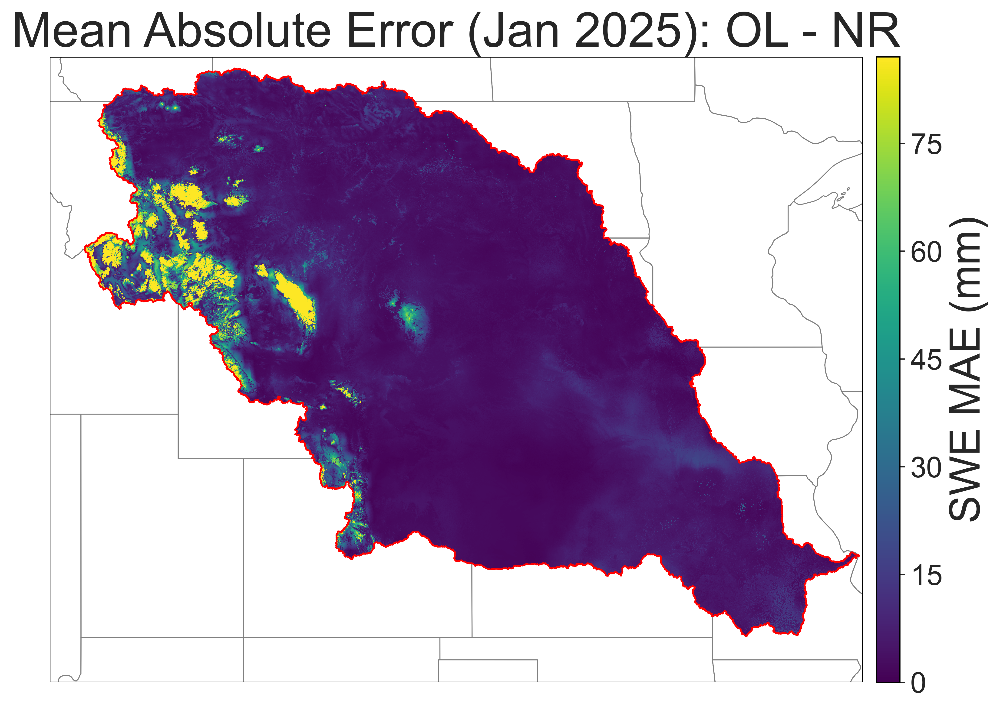

Saved PNG: Images/delta_mae_heuristic.png
Saved TIFF (Pillow): Images/delta_mae_heuristic.tiff
Exported PNG: 4157 x 2900 px — effective DPI at 2.36 in: 1759 dpi


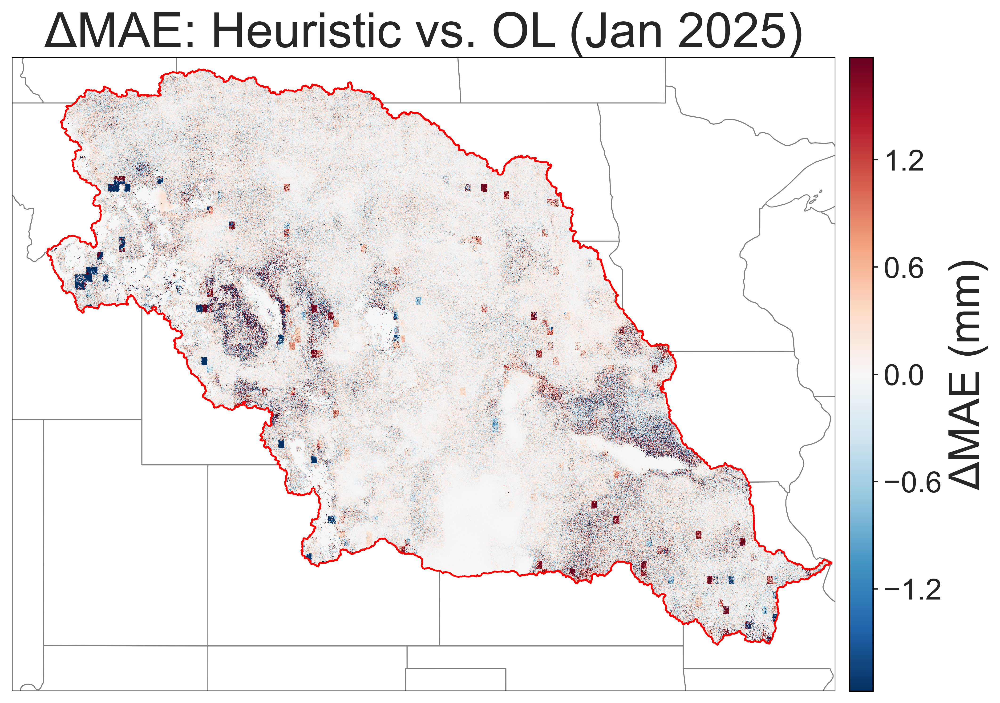

Saved PNG: Images/delta_mae_drot.png
Saved TIFF (Pillow): Images/delta_mae_drot.tiff
Exported PNG: 4157 x 2900 px — effective DPI at 2.36 in: 1759 dpi


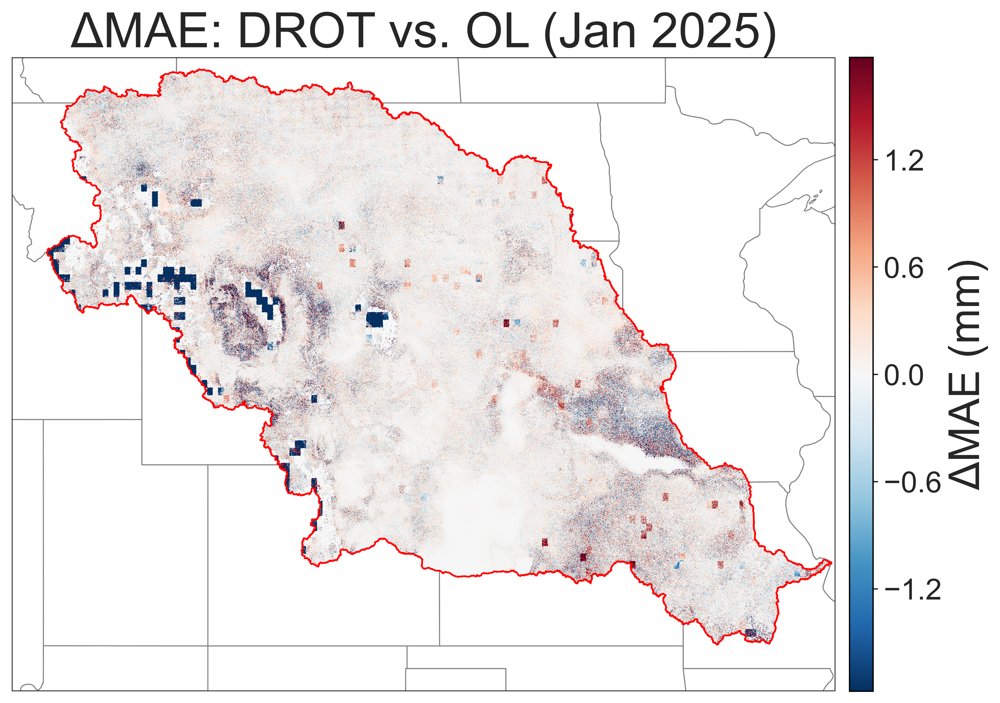

In [ ]:
from matplotlib.ticker import MaxNLocator
from matplotlib.patches import Rectangle
import matplotlib as mpl
import os
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm
import geopandas as gpd


mo_basin = gpd.read_file("WBD_10_HU2_Shape/Shape/WBDHU2.shp").to_crs("EPSG:4326")



doc_textwidth_in = 7.16  

def plot_map(Z, title, cmap, vmin=None, vmax=None, norm=None,
             cbar_label="", fname=None, figsize=None,
             proj=ccrs.PlateCarree(), mo_basin=mo_basin,
             cbar_fraction=0.04, cbar_pad=0.02,
             cbar_aspect=20, cbar_shrink=0.75,
             cbar_nbins=6, save=True):
    """
    Draws a map sized for IEEEtran subfigures and ensures no gray axes box appears.
    """

    # Compute printed subfigure size (so 8pt fonts match 0.33*textwidth)
    # subfig_print_width = 0.33 * doc_textwidth_in
    # if figsize is None:
        # fig_w = subfig_print_width
        # fig_h = subfig_print_width * 0.85
    figsize = (10, 7)

    # Font scaling
    mpl.rcParams.update({
        "font.size": 8,
        "axes.titlesize": 8,
        "axes.labelsize": 8,
        "xtick.labelsize": 7,
        "ytick.labelsize": 7,
        "legend.fontsize": 7,
        "figure.titlesize": 8,
        "savefig.dpi": 500,
        "figure.dpi": 500
    })

    fig, ax = plt.subplots(figsize=figsize, subplot_kw=dict(projection=proj))
    ax.add_feature(cfeature.STATES.with_scale("50m"), edgecolor='gray', linewidth=0.6, zorder=1)

    fig.patch.set_facecolor("white")


    try:
        ax.outline_patch.set_visible(False)

        ax.outline_patch.set_edgecolor("none")
        ax.outline_patch.set_linewidth(0.0)
    except Exception:
        pass

    try:
        ax.patch.set_visible(False)
        ax.patch.set_alpha(0.0)
    except Exception:
        pass

    try:
        ax.set_frame_on(False)
    except Exception:
        pass


    for spine in getattr(ax, "spines", {}).values():
        spine.set_visible(False)

    im = ax.pcolormesh(
        ds_nr.lon, ds_nr.lat, Z,
        transform=ccrs.PlateCarree(), shading="auto",
        cmap=cmap, vmin=vmin, vmax=vmax, norm=norm, zorder=2
    )


    mo_basin.boundary.plot(ax=ax, color="red", linewidth=1.0, zorder=4,
                           transform=ccrs.PlateCarree())


    ax.set_extent([-115, -90, 36, 50], crs=ccrs.PlateCarree())
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.grid(False)


    rect = Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                     edgecolor="black", facecolor="none", lw=0.9, zorder=200)
    ax.add_patch(rect)

    ax.set_title(title, fontsize=30)

    bbox = ax.get_position()
    cax = fig.add_axes([
        bbox.x1 + 0.012,   
        bbox.y0,           
        0.02,              
        bbox.height        
    ])

    cbar = fig.colorbar(im, cax=cax, orientation="vertical")
    cbar.outline.set_edgecolor("black")
    cbar.outline.set_linewidth(0.8)
    cbar.ax.yaxis.set_tick_params(width=0.8, length=3, labelsize=18)
    cbar.set_label(cbar_label, fontsize=26)
    cbar.locator = MaxNLocator(nbins=cbar_nbins)
    cbar.update_ticks()


    os.makedirs("Images", exist_ok=True)

    base_name = title.lower().replace(" ", "_").replace(":", "_") if fname is None else os.path.basename(fname)
    png_path = os.path.join("Images", os.path.splitext(base_name)[0] + ".png")
    tiff_path = os.path.splitext(png_path)[0] + ".tiff"

    export_dpi = 500 

    if save:
        # save PNG 
        fig.savefig(
            png_path,
            dpi=export_dpi,
            bbox_inches="tight",
            pad_inches=0.01,
            facecolor=fig.get_facecolor(),
            edgecolor="none",
            format="png"
        )
        print(f"Saved PNG: {png_path}")

        try:
            from PIL import Image
            with Image.open(png_path) as im:
                im.save(tiff_path, format="TIFF", dpi=(export_dpi, export_dpi), compression="tiff_deflate")
            print(f"Saved TIFF (Pillow): {tiff_path}")
        except Exception as e:
            try:
                fig.savefig(
                    tiff_path,
                    dpi=export_dpi,
                    bbox_inches="tight",
                    pad_inches=0.01,
                    facecolor=fig.get_facecolor(),
                    edgecolor="none",
                    format="tiff"
                )
                print(f"Saved TIFF (matplotlib fallback): {tiff_path}")
            except Exception as e2:
                print("Failed to write TIFF via Pillow and matplotlib:", e, e2)

        try:
            from PIL import Image
            with Image.open(png_path) as im_check:
                w_px, h_px = im_check.size
            printed_width_in = 0.33 * doc_textwidth_in  
            effective_dpi = w_px / printed_width_in
            print(f"Exported PNG: {w_px} x {h_px} px — effective DPI at {printed_width_in:.2f} in: {effective_dpi:.0f} dpi")
        except Exception as e:
            print("Could not read back saved PNG to check dimensions:", e)

    plt.show()
    plt.close(fig)



plot_map(
    Z=mae_spatial_ol,
    title="Mean Absolute Error (Jan 2025): OL - NR",
    cmap="viridis",
    vmin=0.0,
    vmax=vmax_ol,
    norm=None,
    cbar_label="SWE MAE (mm)",
    fname="mae_ol_nr.png",
    figsize=None,           
    cbar_fraction=0.04,
    cbar_pad=0.02,
    cbar_aspect=20,
    cbar_shrink=0.85,
    cbar_nbins=6,
    save=True
)

plot_map(
    Z=diff_dah_plot,
    title="ΔMAE: Heuristic vs. OL (Jan 2025)",
    cmap="RdBu_r",
    vmin=None,
    vmax=None,
    norm=norm,
    cbar_label="ΔMAE (mm)",
    fname="delta_mae_heuristic.png",
    figsize=None,
    cbar_fraction=0.04,
    cbar_pad=0.02,
    cbar_aspect=20,
    cbar_shrink=0.85,
    cbar_nbins=6,
    save=True
)

plot_map(
    Z=diff_drot_plot,
    title="ΔMAE: DROT vs. OL (Jan 2025)",
    cmap="RdBu_r",
    vmin=None,
    vmax=None,
    norm=norm,
    cbar_label="ΔMAE (mm)",
    fname="delta_mae_drot.png",
    figsize=None,
    cbar_fraction=0.04,
    cbar_pad=0.02,
    cbar_aspect=20,
    cbar_shrink=0.85,
    cbar_nbins=6,
    save=True
)
